In [ ]:
!pip install ultralytics
!pip install roboflow
!pip install -q kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 68.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 119.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [ ]:
# YOLOv8 is included in ultralytics package, no need to clone repo
print("YOLOv8 ready via ultralytics package!")

Cloning into 'yolov5'...
remote: Enumerating objects: 17544, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 17544 (delta 25), reused 3 (delta 3), pack-reused 17502 (from 2)
Receiving objects: 100% (17544/17544), 16.61 MiB | 13.47 MiB/s, done.
Resolving deltas: 100% (12019/12019), done.
/content/yolov5


In [ ]:
from google.colab import files

print("Please upload your kaggle.json file:")
uploaded = files.upload()

Please upload your kaggle.json file:


Saving kaggle.json to kaggle.json


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d madsd123/coconut-dataset-for-cmddl-model
!unzip coconut-dataset-for-cmddl-model.zip -d /content/coconut-dataset-for-cmddl-model/

Dataset URL: https://www.kaggle.com/datasets/madsd123/coconut-dataset-for-cmddl-model
License(s): ODbL-1.0
coconut-dataset-for-cmddl-model.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  coconut-dataset-for-cmddl-model.zip
  inflating: /content/coconut-dataset-for-cmddl-model/README.dataset.txt  
  inflating: /content/coconut-dataset-for-cmddl-model/README.roboflow.txt  
  inflating: /content/coconut-dataset-for-cmddl-model/data.yaml  
  inflating: /content/coconut-dataset-for-cmddl-model/test/images/026_jpg.rf.7471e889893fd7f8393880e1264636fc.jpg  
  inflating: /content/coconut-dataset-for-cmddl-model/test/images/030_jpg.rf.bf8b9b31dcadda699117ea362bf6fb90.jpg  
  inflating: /content/coconut-dataset-for-cmddl-model/test/images/056_jpg.rf.fbf3c79d8c7938ab258e2114633d2f53.jpg  
  inflating: /content/coconut-dataset-for-cmddl-model/test/images/094_jpg.rf.a2b00b86e068c19634c00bef0c3f6b54.jpg  
  inflating: /content/coconut-dataset-for-cmddl

In [ ]:
# Step 3: Import libraries
import torch
import yaml
import os
from pathlib import Path
import shutil
import glob
from sklearn.model_selection import train_test_split

print(f'Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else "CPU"})')


Setup complete. Using torch 2.8.0+cu126 (Tesla T4)


In [ ]:
# Step 4: Organize dataset for YOLO format
def organize_yolo_dataset():
    """Organize dataset in YOLO format"""

    # Create YOLO dataset structure
    dataset_path = Path('/content/yolo_dataset')
    for split in ['train', 'val']:
        (dataset_path / split / 'images').mkdir(parents=True, exist_ok=True)
        (dataset_path / split / 'labels').mkdir(parents=True, exist_ok=True)

    return dataset_path


In [ ]:
# Step 5: Process images and create labels
def process_coconut_dataset():
    """Process coconut images and create YOLO annotations"""

    dataset_path = organize_yolo_dataset()
    source_dir = Path('/content/coconut-dataset-for-cmddl-model')

    # Class mapping
    class_names = ['dry_coconut', 'mature_coconut', 'tender_coconut']
    class_mapping = {name: i for i, name in enumerate(class_names)}


    all_image_paths = []
    all_label_paths = []

    # Find all images and labels
    for split in ['train', 'val', 'test']:
        image_dir = source_dir / split / 'images'
        label_dir = source_dir / split / 'labels'

        # Assuming image files are .jpg, .jpeg, or .png
        for ext in ['*.jpg', '*.jpeg', '*.png']:
            all_image_paths.extend(glob.glob(str(image_dir / ext)))

        # Assuming label files are .txt
        all_label_paths.extend(glob.glob(str(label_dir / '*.txt')))


    print(f"Found {len(all_image_paths)} images and {len(all_label_paths)} labels total")

    # Create a dictionary to map image file names to label file names
    image_to_label = {Path(img).stem: lbl for lbl in all_label_paths for img in all_image_paths if Path(lbl).stem == Path(img).stem}

    # Filter images to only include those with corresponding labels
    filtered_image_paths = [img for img in all_image_paths if Path(img).stem in image_to_label]
    filtered_label_paths = [image_to_label[Path(img).stem] for img in filtered_image_paths]

    print(f"Found {len(filtered_image_paths)} images with corresponding labels")


    # Split dataset: 834 for training, rest for validation
    if len(filtered_image_paths) >= 834:
        train_images, val_images, train_labels_paths, val_labels_paths = train_test_split(
            filtered_image_paths, filtered_label_paths, train_size=834, random_state=42,
            stratify=[Path(img).parent.parent.name for img in filtered_image_paths] if len(set([Path(img).parent.parent.name for img in filtered_image_paths])) > 1 else None
        )
    else:
        # If less than 834 images, use 80-20 split
        train_images, val_images, train_labels_paths, val_labels_paths = train_test_split(
            filtered_image_paths, filtered_label_paths, test_size=0.2, random_state=42,
            stratify=[Path(img).parent.parent.name for img in filtered_image_paths] if len(set([Path(img).parent.parent.name for img in filtered_image_paths])) > 1 else None
        )

    print(f"Training images: {len(train_images)}")
    print(f"Validation images: {len(val_images)}")

    # Copy images and labels to the new YOLO dataset structure
    for split, images, label_paths in [('train', train_images, train_labels_paths), ('val', val_images, val_labels_paths)]:
        for img_path, label_path in zip(images, label_paths):
            # Copy image
            img_name = Path(img_path).name
            dest_img = dataset_path / split / 'images' / img_name
            shutil.copy2(img_path, dest_img)

            # Copy label
            label_name = Path(label_path).name
            dest_label = dataset_path / split / 'labels' / label_name
            shutil.copy2(label_path, dest_label)


    return dataset_path

In [ ]:
# Step 6: Create dataset YAML file
def create_dataset_yaml(dataset_path):
    """Create YAML configuration file for YOLO training"""

    yaml_content = {
        'path': str(dataset_path.absolute()),
        'train': 'train/images',
        'val': 'val/images',
        'nc': 3,  # number of classes
        'names': ['dry_coconut', 'mature_coconut', 'tender_coconut']
    }

    yaml_path = dataset_path / 'coconut.yaml'
    with open(yaml_path, 'w') as f:
        yaml.dump(yaml_content, f)

    print(f"Dataset YAML created at: {yaml_path}")
    return yaml_path

In [ ]:
# Step 7: Train YOLOv8 model
def train_yolov8(yaml_path):
    """Train YOLOv8 model using pretrained weights"""
    
    from ultralytics import YOLO
    
    # Load a YOLOv8 model (yolov8s.pt, yolov8n.pt, yolov8m.pt, etc.)
    model = YOLO('yolov8s.pt')  # or yolov8n.pt for faster training
    
    # Train the model
    results = model.train(
        data=str(yaml_path),
        epochs=100,
        imgsz=640,
        batch=16,
        name='coconut_classifier',
        cache=True,
        patience=20,
        save_period=10
    )
    
    print("Training completed!")
    return results

In [ ]:
# Step 8: Validate model
def validate_model():
    """Validate the trained model"""
    
    from ultralytics import YOLO
    
    # Load the best trained model
    model = YOLO('runs/train/coconut_classifier/weights/best.pt')
    
    # Validate the model
    results = model.val()
    
    print("Validation completed!")
    return results

In [ ]:
# Step 9: Test inference
def test_inference():
    """Test inference on sample images"""
    
    from ultralytics import YOLO
    
    # Load the best trained model
    model = YOLO('runs/train/coconut_classifier/weights/best.pt')
    
    # Run inference on validation images
    results = model('/content/yolo_dataset/val/images', 
                   conf=0.25, 
                   save=True,
                   project='runs/detect',
                   name='coconut_test')
    
    print("Inference completed!")
    return results

In [ ]:
# Step 10: Main execution (Updated for Colab)
def main():
    """Run the complete pipeline with proper error handling for Colab"""
    
    try:
        print(" Processing coconut dataset...")
        dataset_path = process_coconut_dataset()

        print(" Creating YAML configuration...")
        yaml_path = create_dataset_yaml(dataset_path)

        print(" Starting YOLOv8 training...")
        train_results = train_yolov8(yaml_path)
        
        # Training is complete when train_yolov8 returns
        print(" Training completed successfully!")
        
        # Small delay to ensure all files are written
        import time
        time.sleep(2)
        
        # Check if weights exist
        weights_path = 'runs/train/coconut_classifier/weights/best.pt'
        if os.path.exists(weights_path):
            print(" Validating model...")
            validate_model()

            print(" Testing inference...")
            test_inference()
            
            print(" Pipeline completed successfully!")
        else:
            print(" Warning: best.pt not found after training")
            print("Training may have completed with issues.")
            
    except Exception as e:
        print(f" Error in pipeline: {e}")
        import traceback
        traceback.print_exc()

# Run the pipeline
main()

Streaming output truncated to the last 5000 lines.
      55/99      4.57G    0.02319    0.01247   0.007074         33        640:  62% 33/53 [00:08<00:06,  3.26it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      55/99      4.57G    0.02312    0.01246   0.007036         40        640:  64% 34/53 [00:08<00:06,  3.08it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      55/99      4.57G    0.02296    0.01235   0.006927         35        640:  66% 35/53 [00:09<00:05,  3.13it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      55/99      4.57G    0.02291    

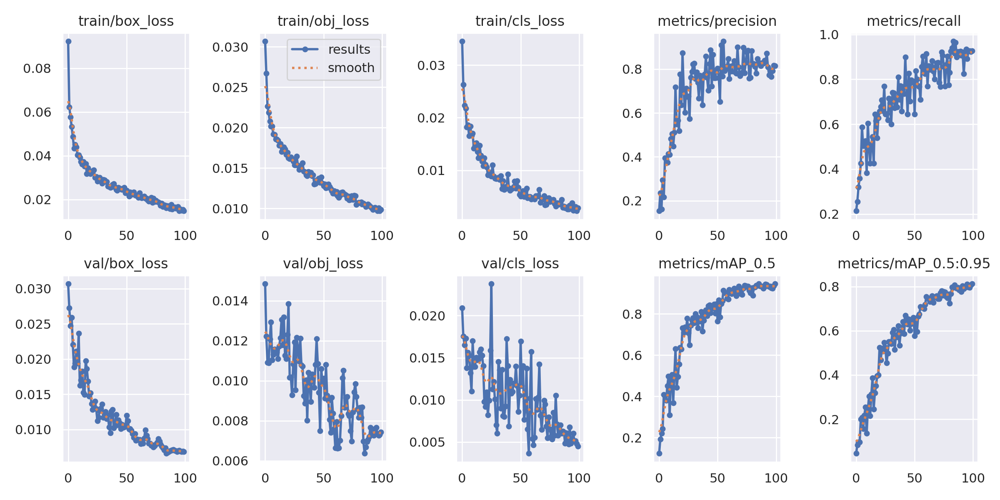

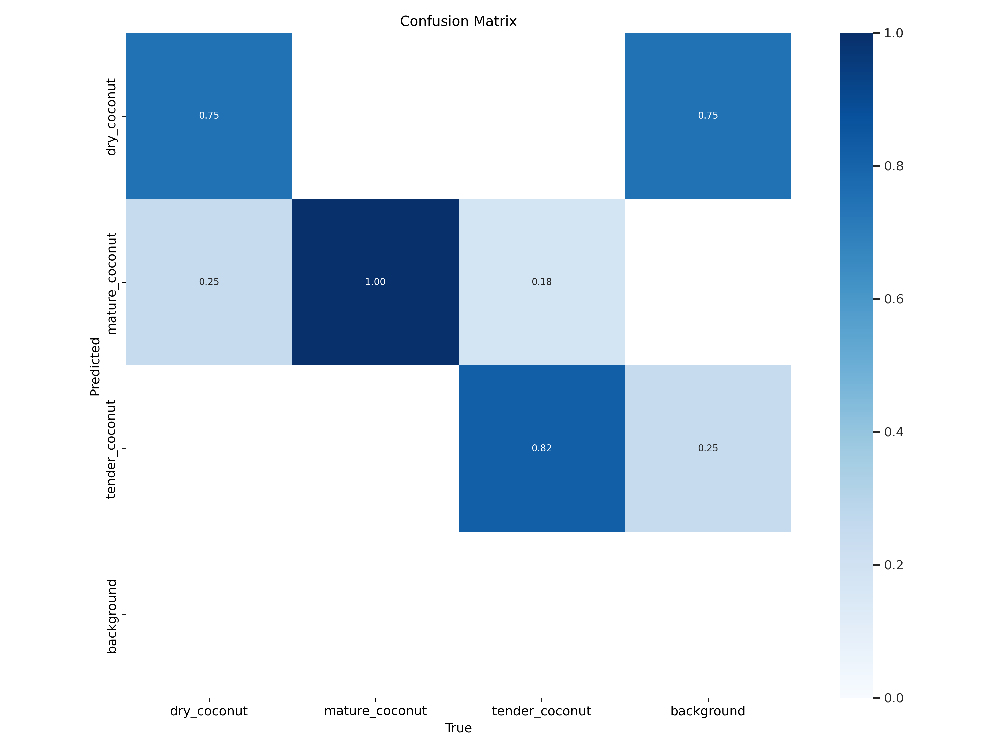

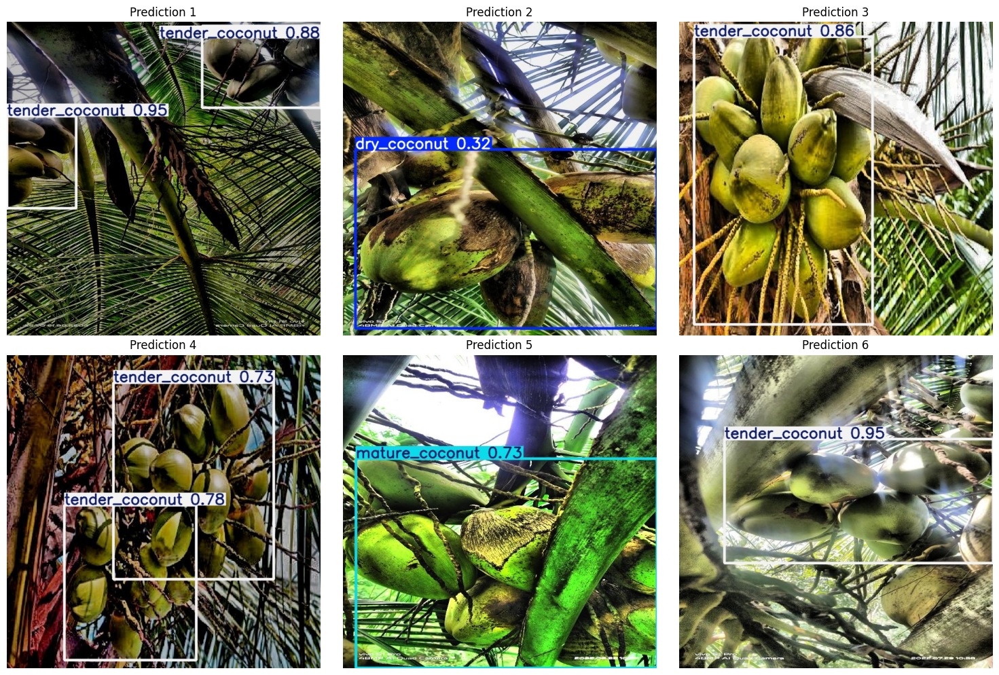

In [ ]:
# Step 11: View results
from IPython.display import Image, display
import matplotlib.pyplot as plt

def show_results():
    """Display training results"""

    # Show training plots
    try:
        display(Image('runs/train/coconut_classifier/results.png'))
    except:
        print("Results plot not found")

    # Show confusion matrix
    try:
        display(Image('runs/train/coconut_classifier/confusion_matrix.png'))
    except:
        print("Confusion matrix not found")

    # Show sample predictions
    try:
        import glob
        pred_images = glob.glob('runs/detect/coconut_test/*.jpg')
        if pred_images:
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            axes = axes.flatten()

            for i, img_path in enumerate(pred_images[:6]):
                img = plt.imread(img_path)
                axes[i].imshow(img)
                axes[i].set_title(f'Prediction {i+1}')
                axes[i].axis('off')

            plt.tight_layout()
            plt.show()
    except:
        print("Sample predictions not available")

# Show results after training
show_results()

In [ ]:
# Step 12: Load trained model for custom inference
def load_and_predict(image_path):
    """Load trained model and make prediction"""
    
    from ultralytics import YOLO
    
    # Load the trained YOLOv8 model
    model = YOLO('runs/train/coconut_classifier/weights/best.pt')
    
    # Run inference
    results = model(image_path)
    
    # Display results
    results[0].show()
    
    # Print detection details
    for box in results[0].boxes:
        if box is not None:
            label = model.names[int(box.cls)]
            conf = float(box.conf)
            print(f"Detected: {label} (Confidence: {conf:.3f})")
    
    return results

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-8-22 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


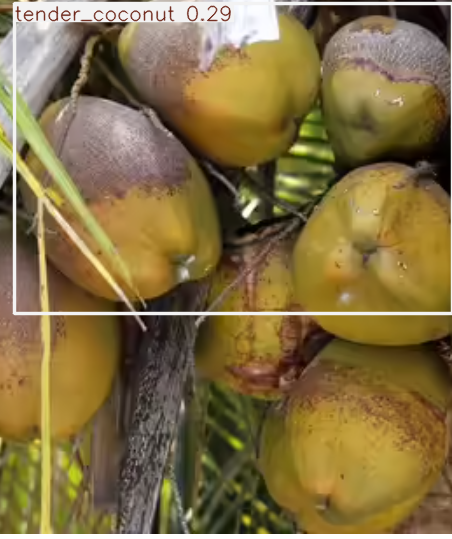

In [ ]:
results = load_and_predict('/content/Screenshot 2025-08-22 190920.png')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-8-22 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


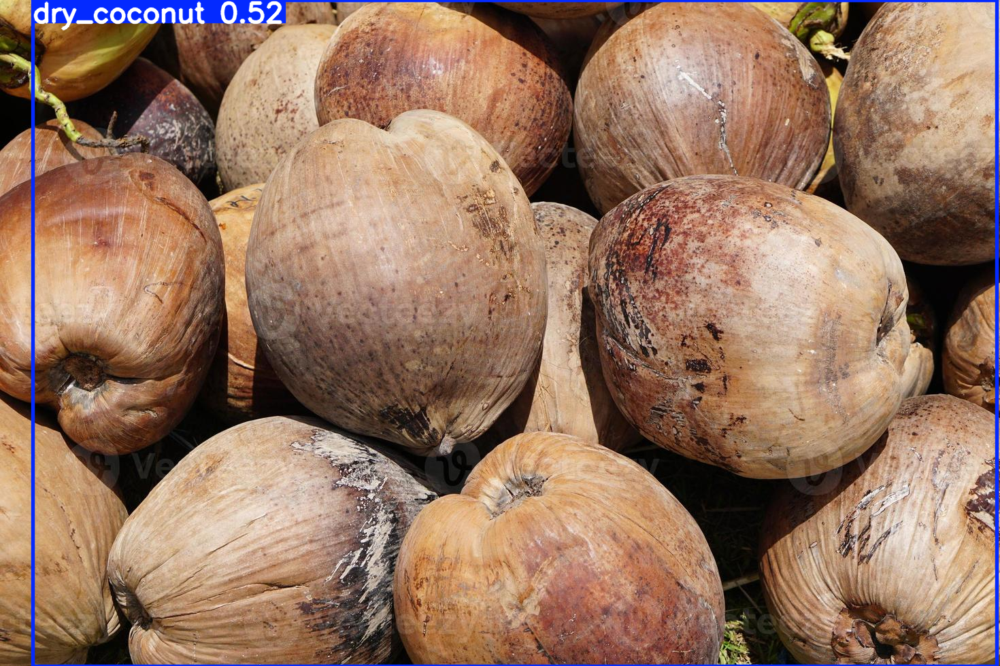

In [ ]:
results = load_and_predict('/content/drr.jpg')

In [ ]:
def download_results():
    """Download all training results and models"""

    from google.colab import files
    import zipfile
    import os

    # Create a zip file with all results
    zip_filename = '/content/coconut_yolov5_results.zip'

    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:

        # Add trained models
        model_files = [
            'runs/train/coconut_classifier/weights/best.pt',
            'runs/train/coconut_classifier/weights/last.pt'
        ]

        for file_path in model_files:
            if os.path.exists(file_path):
                zipf.write(file_path, os.path.basename(file_path))
                print(f"Added: {file_path}")

        # Add training results and plots
        result_files = [
            'runs/train/coconut_classifier/results.png',
            'runs/train/coconut_classifier/confusion_matrix.png',
            'runs/train/coconut_classifier/results.csv',
            'runs/train/coconut_classifier/hyp.yaml',
            'runs/train/coconut_classifier/opt.yaml'
        ]

        for file_path in result_files:
            if os.path.exists(file_path):
                zipf.write(file_path, f"results_{os.path.basename(file_path)}")
                print(f"Added: {file_path}")

        # Add sample predictions
        import glob
        pred_images = glob.glob('runs/detect/coconut_test/*.jpg')
        for i, img_path in enumerate(pred_images[:10]):  # First 10 predictions
            zipf.write(img_path, f"predictions/prediction_{i+1}.jpg")
            print(f"Added: {img_path}")

    print(f"\nDownloading results zip file...")
    files.download(zip_filename)

    print("Download complete!")

# Run this cell to download all results
download_results()

Added: runs/train/coconut_classifier/weights/best.pt
Added: runs/train/coconut_classifier/weights/last.pt
Added: runs/train/coconut_classifier/results.png
Added: runs/train/coconut_classifier/confusion_matrix.png
Added: runs/train/coconut_classifier/results.csv
Added: runs/train/coconut_classifier/hyp.yaml
Added: runs/train/coconut_classifier/opt.yaml
Added: runs/detect/coconut_test/04_jpg.rf.7c237959701cf3e84050663258debb2c.jpg
Added: runs/detect/coconut_test/98_jpg.rf.404a86337bd6de1acc1e55a5004d5bdf.jpg
Added: runs/detect/coconut_test/736_jpg.rf.ad448dfb280d6be61e9906b22c6467c1.jpg
Added: runs/detect/coconut_test/650_jpg.rf.d175af91e7525cc40c294af20a3b1252.jpg
Added: runs/detect/coconut_test/87_jpg.rf.facce9ddb9d5f1ecb78df64046fff026.jpg
Added: runs/detect/coconut_test/75_jpg.rf.f0cde20dfe3cf7ebc9ce05b56f577b5a.jpg
Added: runs/detect/coconut_test/138_jpg.rf.8296aaf02f59221ed65f21e5f974ab47.jpg
Added: runs/detect/coconut_test/108_jpg.rf.62719b2003155a94d2eebc8650fde44d.jpg
Added: run

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download complete!
